### LSE Data Analytics Online Career Accelerator

# DA201: Data Analytics using Python

## Assignment : COVID-19 data

In [100]:
# Import the required libraries and set the plotting options
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc = {'figure.figsize':(15,8)})

### Required: Report submission:
Insert URL (to your public GitHub repository) and a screenshot - double click cell to edit
- [My Github Repo](https://github.com/CristinaCod91/LSE_DA_COVID_analysis)


- 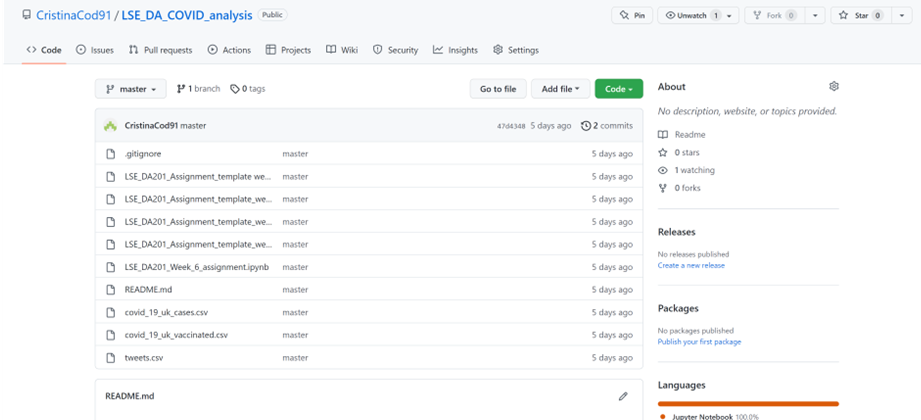


## 2) Assignment activity 2: 

### 2.1) Report expectations:
- Load the files `covid_19_uk_cases.csv` and `covid_19_uk_vaccinated.csv` and explore the data.
- Explore the data using the `info()`, `describe()`, `shape` and `value_counts()` methods, and note the observations regarding data types, number or records and features.
- Identify missing data.
- Filter/subset data.
- Aggregate data (totals and by month).
- Note observations.

In [2]:
# Load the COVID-19 cases and vaccine data sets as cov and vac respectively.
cov = pd.read_csv('covid_19_uk_cases.csv')
vac = pd.read_csv('covid_19_uk_vaccinated.csv') 


In [3]:
# Explore the DataFrames with the appropriate functions.
# View data in the DataFrame.
# View the first 5 rows.
cov.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0


In [4]:
# View the last 5 rows.
cov.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,137735.0,8154306.0,0.0,378.0
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,137763.0,8193769.0,0.0,386.0
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,137944.0,8231437.0,0.0,386.0
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,138080.0,8272883.0,0.0,0.0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,138237.0,8317439.0,0.0,0.0


In [5]:
vac.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0


In [6]:
vac.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,1070,1216,1070
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,1300,1604,1300
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,1482,2027,1482
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,0,0,0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,0,0,0


In [7]:
# Determine the number of rows and columns.
print(cov.shape)
print(vac.shape)

(7584, 12)
(7584, 11)


In [8]:
# Determine the data types in the DataFrames.
print(cov.dtypes)
print(vac.dtypes)

Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
dtype: object
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object


In [9]:
# Determine the number of missing values.
# The shape output is always (rows, columns).
cov_na = cov[cov.isna().any(axis=1)]
cov_na.shape

(2, 12)

In [10]:
vac_na = vac[vac.isna().any(axis=1)]
vac_na.shape

(0, 11)

In [11]:
# List all columns
my_list = cov.columns.values.tolist()

# View the output
print(my_list)

['Province/State', 'Country/Region', 'Lat', 'Long', 'ISO 3166-1 Alpha 3-Codes', 'Sub-region Name', 'Intermediate Region Code', 'Date', 'Deaths', 'Cases', 'Recovered', 'Hospitalised']


In [12]:
# List all columns
my_list = vac.columns.values.tolist()

# View the output
print(my_list)

['Province/State', 'Country/Region', 'Lat', 'Long', 'ISO 3166-1 Alpha 3-Codes', 'Sub-region Name', 'Intermediate Region Code', 'Date', 'Vaccinated', 'First Dose', 'Second Dose']


In [13]:
# Create DataFrame based on Gibraltar data
# Hint: newdf = df[df[col]==index]
gibraltar_cov = cov[cov['Province/State']=='Gibraltar']

gibraltar_cov

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4419,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-10,97.0,5626.0,0.0,858.0
4420,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-11,97.0,5655.0,0.0,876.0
4421,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-12,97.0,5682.0,0.0,876.0
4422,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-13,97.0,5707.0,0.0,0.0


In [14]:
# Subset the Gibraltar DataFrame: Deaths, Cases, Recovered and Hospitalised.
# [1] Selecting few columns.
gibraltar_cov_2 = gibraltar_cov [['Date','Deaths', 'Cases', 'Recovered', 'Hospitalised']]
gibraltar_cov_2

,Date,Deaths,Cases,Recovered,Hospitalised
3792,2020-01-22,0.0,0.0,0.0,0.0
3793,2020-01-23,0.0,0.0,0.0,0.0
3794,2020-01-24,0.0,0.0,0.0,0.0
3795,2020-01-25,0.0,0.0,0.0,0.0
3796,2020-01-26,0.0,0.0,0.0,0.0
...,...,...,...,...,...
4419,2021-10-10,97.0,5626.0,0.0,858.0
4420,2021-10-11,97.0,5655.0,0.0,876.0
4421,2021-10-12,97.0,5682.0,0.0,876.0
4422,2021-10-13,97.0,5707.0,0.0,0.0


In [15]:
# Run the describe() function to generate descriptive statistics.
# Descriptive statistics.
gibraltar_cov_2.describe()

,Deaths,Cases,Recovered,Hospitalised
count,632.000000,632.000000,632.000000,632.000000
mean,40.208861,2237.109177,1512.821203,1027.625000
std,45.332832,2136.268090,1817.096755,1145.681058
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,177.000000,109.500000,157.750000
50%,5.000000,1036.500000,323.500000,675.500000
75%,94.000000,4286.000000,4122.500000,1548.000000
max,97.000000,5727.000000,4670.000000,4907.000000


In [16]:
# Explore behaviour over time
# How has the number of vaccinated individuals changed over time?
# What might these changes indicate? Include reasons to support your rationale.

# max = Returns max of a column
print(vac['Vaccinated'].max())

# min = Returns min of a column
print(vac['Vaccinated'].min())

69619
0


In [17]:
# Sorting: arranging the data in a certain order to derive better insights.
vac.sort_values(by=['Vaccinated'], inplace=True)
vac

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
4143,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-01-07,0,0,0
4142,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-01-06,0,0,0
4141,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-01-05,0,0,0
4140,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-01-04,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
4242,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-04-16,62458,16945,62458
5514,Montserrat,United Kingdom,16.742498,-62.187366,MSR,Latin America and the Caribbean,29,2021-04-24,62978,17108,62978
5542,Montserrat,United Kingdom,16.742498,-62.187366,MSR,Latin America and the Caribbean,29,2021-05-22,64049,23622,64049
4250,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-04-24,68454,18596,68454


In [18]:
# Sorting descending.
vac.sort_values(by=['Vaccinated'], inplace=True, ascending=False)
vac

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
4278,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-05-22,69619,25676,69619
4250,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-04-24,68454,18596,68454
5542,Montserrat,United Kingdom,16.742498,-62.187366,MSR,Latin America and the Caribbean,29,2021-05-22,64049,23622,64049
5514,Montserrat,United Kingdom,16.742498,-62.187366,MSR,Latin America and the Caribbean,29,2021-04-24,62978,17108,62978
4242,Gibraltar,United Kingdom,36.140800,-5.353600,GIB,Southern Europe,0,2021-04-16,62458,16945,62458
...,...,...,...,...,...,...,...,...,...,...,...
5809,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,GBR,Northern Europe,0,2020-05-22,0,0,0
5916,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,GBR,Northern Europe,0,2020-09-06,0,0,0
5917,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,GBR,Northern Europe,0,2020-09-07,0,0,0
5918,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,GBR,Northern Europe,0,2020-09-08,0,0,0


In [19]:
# On which date(s) are there values missing, and from which columns and rows are these values missing?
# Which states or provinces do the missing values belong to?
null_data = vac[vac.isnull().any(axis=1)]
null_data

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose


In [20]:
null_data = cov[cov.isnull().any(axis=1)]
null_data

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
875,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-21,NaN,NaN,NaN,NaN
876,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-22,NaN,NaN,NaN,NaN


### 2. Conclusion
* The data provided had to be analysed first so that accurate insights could be drawn. Both csv files have the same number of rows, being 7584. With regards to the number of missing values, cov_19_uk_vaccinated csv file does not have any, compare to covid_19_uk_cases, which has 2 rows of NaNs on dates 2020-09-21, 2020-09-22 for Bermuda state. The columns having NaN are on Deaths, Cases, Recovered, Hospitalised.

* When looking at the trend for all regions, the number of first dose vaccinations starts increasing from January 2021, hitting its peak by March 2021 to 94,000 vaccines and then massively decreasing around April 2021. It then continues to gradually increase. However, the highest number reaches only 34,000 in June 2021, which, is down by triple the number of vaccines registered in March. Furthermore, they continue to steadily decrease until October 2021. 

* With regards to the second dose vaccinations, it is important to mention that people are more reluctant on getting it as the number of vaccines throughout the period did not have high spikes compare to the first dose. One of the reasons could be that they were taking more time to decide whether it is the right decision to take, being afraid of side effects or perhaps a problem in the supply. However, the percentage difference between the total first and second dose vaccinations is not high, being only 2% down.




## 3) Assignment activity 3: 

### 3.1) Report expectations:
- Merge and explore the data.
- Convert the data type of the Date column from object to DateTime.
- Create a data set that meets the expected parameters.
- Add calculated features to DataFrames (difference between first and second dose vaccinations).
- Filter and sort output.
- Observe totals and percentages as a total and over time.
- Note observations.

Merge the DataFrames without duplicating columns. The new DataFrame (e.g. `covid`) will have `7584` rows and the following columns: `Province/State, Country/Region, Date, Vaccinated, First Dose, Second Dose, Deaths, Cases, Recovered, Hospitalised`.

In [21]:
# Join the DataFrames as covid where you merge cov and vac.
cov = pd.read_csv('covid_19_uk_cases.csv')
vac = pd.read_csv('covid_19_uk_vaccinated.csv')

# covid = pd.merge(cov, vac, on='Date', how='left')
covid = pd.merge(cov, vac, left_index=True, right_index=True)

# View the new DataFrame.
covid.head()


,Province/State_x,Country/Region_x,Lat_x,Long_x,ISO 3166-1 Alpha 3-Codes_x,Sub-region Name_x,Intermediate Region Code_x,Date_x,Deaths,Cases,...,Country/Region_y,Lat_y,Long_y,ISO 3166-1 Alpha 3-Codes_y,Sub-region Name_y,Intermediate Region Code_y,Date_y,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0


In [22]:
# Detect for any duplications after merging the two datasets.
covid.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7579    False
7580    False
7581    False
7582    False
7583    False
Length: 7584, dtype: bool

In [23]:
# Explore the new DataFrame.
# Determine the column names and data types.
print(covid.columns)
print(covid.dtypes)

Index(['Province/State_x', 'Country/Region_x', 'Lat_x', 'Long_x',
       'ISO 3166-1 Alpha 3-Codes_x', 'Sub-region Name_x',
       'Intermediate Region Code_x', 'Date_x', 'Deaths', 'Cases', 'Recovered',
       'Hospitalised', 'Province/State_y', 'Country/Region_y', 'Lat_y',
       'Long_y', 'ISO 3166-1 Alpha 3-Codes_y', 'Sub-region Name_y',
       'Intermediate Region Code_y', 'Date_y', 'Vaccinated', 'First Dose',
       'Second Dose'],
      dtype='object')
Province/State_x               object
Country/Region_x               object
Lat_x                         float64
Long_x                        float64
ISO 3166-1 Alpha 3-Codes_x     object
Sub-region Name_x              object
Intermediate Region Code_x      int64
Date_x                         object
Deaths                        float64
Cases                         float64
Recovered                     float64
Hospitalised                  float64
Province/State_y               object
Country/Region_y               object
Lat_y

In [24]:
# Fix the date column data type.
# Convert the data type of the Date column from object to DateTime.
covid['Date_x'] = pd.to_datetime(covid['Date_x'])
covid['Date_y'] = pd.to_datetime(covid['Date_y'])
covid.dtypes

Province/State_x                      object
Country/Region_x                      object
Lat_x                                float64
Long_x                               float64
ISO 3166-1 Alpha 3-Codes_x            object
Sub-region Name_x                     object
Intermediate Region Code_x             int64
Date_x                        datetime64[ns]
Deaths                               float64
Cases                                float64
Recovered                            float64
Hospitalised                         float64
Province/State_y                      object
Country/Region_y                      object
Lat_y                                float64
Long_y                               float64
ISO 3166-1 Alpha 3-Codes_y            object
Sub-region Name_y                     object
Intermediate Region Code_y             int64
Date_y                        datetime64[ns]
Vaccinated                             int64
First Dose                             int64
Second Dos

In [25]:
# Clean up / drop unnecessary columns .
covid1 = covid.drop(columns=['Country/Region_x', 'Lat_x', 'Long_x', 
                             'ISO 3166-1 Alpha 3-Codes_x', 'Intermediate Region Code_x',
                             'Date_y','Deaths','Cases', 'Recovered','Hospitalised','Province/State_y', 
                             'Country/Region_y', 'Lat_y','Long_y','ISO 3166-1 Alpha 3-Codes_y',
                             'Sub-region Name_y', 'Intermediate Region Code_y'])
covid1

,Province/State_x,Sub-region Name_x,Date_x,Vaccinated,First Dose,Second Dose
0,Anguilla,Latin America and the Caribbean,2020-01-22,0,0,0
1,Anguilla,Latin America and the Caribbean,2020-01-23,0,0,0
2,Anguilla,Latin America and the Caribbean,2020-01-24,0,0,0
3,Anguilla,Latin America and the Caribbean,2020-01-25,0,0,0
4,Anguilla,Latin America and the Caribbean,2020-01-26,0,0,0
...,...,...,...,...,...,...
7579,Others,Northern Europe,2021-10-10,1070,1216,1070
7580,Others,Northern Europe,2021-10-11,1300,1604,1300
7581,Others,Northern Europe,2021-10-12,1482,2027,1482
7582,Others,Northern Europe,2021-10-13,0,0,0


In [97]:
# Groupby and calculate the difference between first and second dose over time.
pd.set_option("display.max_rows", None)
covid2 = covid1.groupby(["Date_x"])[["First Dose", "Second Dose"]].sum().reset_index()
covid2[(covid2['Date_x'] > '2021-01-11') & (covid2['Date_x'] < '2021-10-12')]

,Date_x,First Dose,Second Dose
356,2021-01-12,207661,16065
357,2021-01-13,278943,9745
358,2021-01-14,316695,5257
359,2021-01-15,341317,4209
360,2021-01-16,296131,2619
361,2021-01-17,190106,2239
362,2021-01-18,204077,4565
363,2021-01-19,343163,3759
364,2021-01-20,363507,3412
365,2021-01-21,409855,2760


<Figure size 1080x576 with 0 Axes>

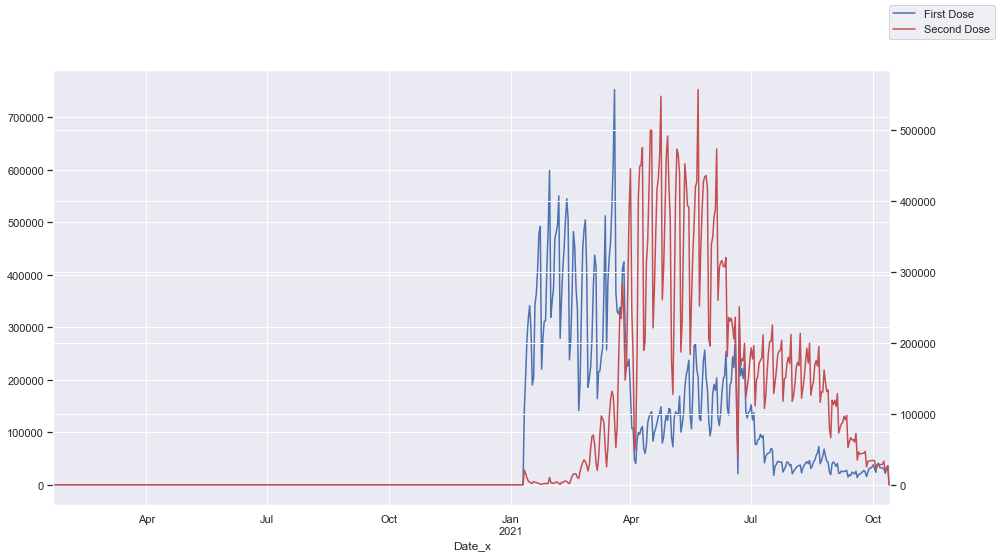

In [101]:
# Create a lineplot to visualise the trend of first and second dose.
plt.figure(figsize = (15,8))
ax = covid2.plot(x="Date_x", y="First Dose", legend=False)
ax2 = ax.twinx()
covid2.plot(x="Date_x", y="Second Dose", ax=ax2, legend=False, color="r")
ax.figure.legend()
plt.show()

In [103]:
# Resampling data set to months.
import datetime as dt
covid2.index = pd.DatetimeIndex(covid2['Date_x'])
covid2 = covid2.resample('M').mean()

# View the DataFrame.
covid2

,First Dose,Second Dose
Date_x,,
2020-01-31,0.000000,0.000000
2020-02-29,0.000000,0.000000
2020-03-31,0.000000,0.000000
2020-04-30,0.000000,0.000000
2020-05-31,0.000000,0.000000
2020-06-30,0.000000,0.000000
2020-07-31,0.000000,0.000000
2020-08-31,0.000000,0.000000
2020-09-30,0.000000,0.000000


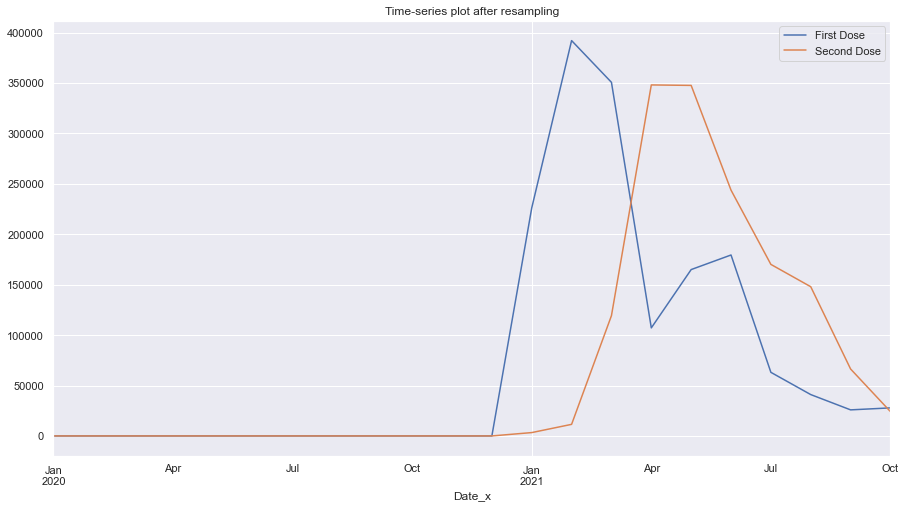

<Figure size 1080x576 with 0 Axes>

In [104]:
# Plotting the time-series data to inspect how data behaves differently under different frequency.
covid2.plot(figsize=(15, 8))
plt.legend(loc='best')
plt.title("Time-series plot after resampling")
plt.show(block=False)

#Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective6.png", dpi=300)

In [30]:
# How has the number of individuals who have received the first and second doses, changed over time?
pd.set_option("display.max_rows", None)
covid_gibraltar = covid1.groupby(["Province/State_x", "Date_x"])[["First Dose", "Second Dose"]].sum().reset_index()
filtering = covid_gibraltar ["Province/State_x"] == "Gibraltar"
covid_gibraltar .where(filtering,inplace=True)
covid_gibraltar[(covid_gibraltar['Date_x'] > '2021-01-11') & (covid_gibraltar['Date_x'] < '2021-10-12')]
#covid_gibraltar.drop("Province/State_x")

,Province/State_x,Date_x,First Dose,Second Dose
4148,Gibraltar,2021-01-12,25958.0,2008.0
4149,Gibraltar,2021-01-13,34868.0,1218.0
4150,Gibraltar,2021-01-14,39587.0,657.0
4151,Gibraltar,2021-01-15,42665.0,526.0
4152,Gibraltar,2021-01-16,37016.0,328.0
4153,Gibraltar,2021-01-17,23763.0,280.0
4154,Gibraltar,2021-01-18,25510.0,571.0
4155,Gibraltar,2021-01-19,42895.0,470.0
4156,Gibraltar,2021-01-20,45438.0,426.0
4157,Gibraltar,2021-01-21,51232.0,345.0


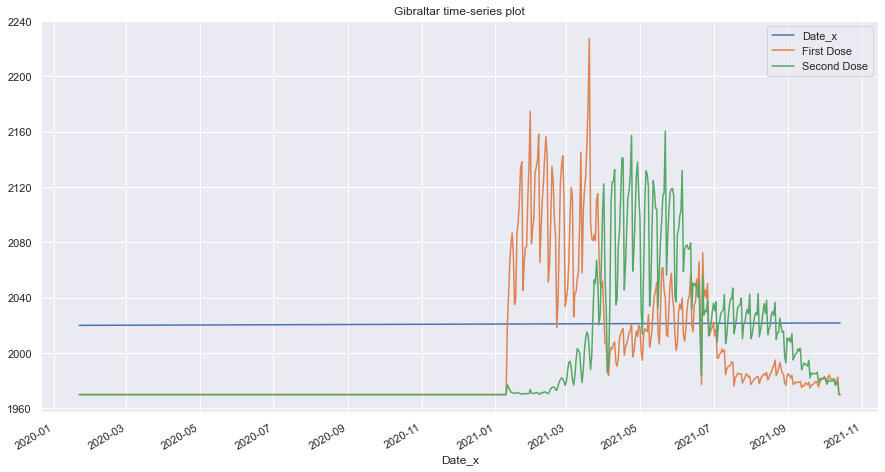

<Figure size 1080x576 with 0 Axes>

In [105]:
# Plotting the time-series data to inspect how data behaves differently under different frequency.
import datetime as dt
covid_gibraltar.index = pd.DatetimeIndex(covid_gibraltar['Date_x'])
covid_gibraltar.plot(figsize=(15, 8))
plt.legend(loc='best')
plt.title("Gibraltar time-series plot")
plt.show(block=False)

#Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective6.png", dpi=300)

In [35]:
# Which Province/State has the highest number of individuals who have received a first dose but not a second dose?
covid_2nd_dose_miss = covid1.groupby("Province/State_x")[["First Dose", "Second Dose"]].sum()
covid_2nd_dose_miss['num.missing.2nd_dose']= covid_2nd_dose_miss['First Dose'] - covid_2nd_dose_miss['Second Dose']
covid_2nd_dose_miss.sort_values(by=['num.missing.2nd_dose'], inplace=True, ascending=False)
covid_2nd_dose_miss

,First Dose,Second Dose,num.missing.2nd_dose
Province/State_x,,,
Gibraltar,5870786,5606041,264745
Montserrat,5401128,5157560,243568
British Virgin Islands,5166303,4933315,232988
Anguilla,4931470,4709072,222398
Isle of Man,4226984,4036345,190639
Falkland Islands (Malvinas),3757307,3587869,169438
Cayman Islands,3522476,3363624,158852
Channel Islands,3287646,3139385,148261
Turks and Caicos Islands,3052822,2915136,137686


In [36]:
# Which Province/State has the highest percentage of individuals who have received a first dose but not a second dose.
covid_2nd_dose_miss['%num.missing.2nd_dose']= covid_2nd_dose_miss['num.missing.2nd_dose'] / covid_2nd_dose_miss['First Dose']
covid_2nd_dose_miss.sort_values(by=['%num.missing.2nd_dose'], inplace=True, ascending=False)
covid_2nd_dose_miss

,First Dose,Second Dose,num.missing.2nd_dose,%num.missing.2nd_dose
Province/State_x,,,,
Turks and Caicos Islands,3052822,2915136,137686,0.045101
Isle of Man,4226984,4036345,190639,0.045100
Anguilla,4931470,4709072,222398,0.045098
British Virgin Islands,5166303,4933315,232988,0.045098
Cayman Islands,3522476,3363624,158852,0.045097
Channel Islands,3287646,3139385,148261,0.045096
Montserrat,5401128,5157560,243568,0.045096
Falkland Islands (Malvinas),3757307,3587869,169438,0.045096
Gibraltar,5870786,5606041,264745,0.045095


### 3.Conclusion

* By analysing how has the number of vaccinated individuals changed over time, it can be described that from January 2021 to end of March 2021, first dose is surpassing the second dose on a daily number of vaccines. However, it was noticed that from the March 30th, 2021, second dose took over the leadership in total daily numbers and continued to do so until the October 2nd, 2021.

* Similar trend can be seen when looking at a particular state/province. On Gibraltar, second dose is surpassing the first dose numbers starting from March 30th, 2021, however, an unusual sharp drop in vaccines was noticed in June 6th, 2021 along with another decline detected on dates August 29th -30th, 2021.

* By calculating the percentage of first dose to fully vaccinated, Turks and Caicos Islands where the highest in not fully vaccinated, followed by Isle of Man and Anguilla. The ones having the highest percentage of fully vaccinated were Saint Helena, Ascension and Tristan da Cunha, Others, Bermuda, and Gibraltar.

## 4) Assignment activity 4: 

The government is looking to promote second dose vaccinations and would like to know the best possible area to test a new campaign. They are looking for the highest number of people who have received a first dose and not a second dose. 
- Where should they target?
- Which provinces have the highest number (actual numbers) and highest relative numbers (second dose only/first dose)?
- Visualise both outputs.

In [37]:
# Import the libraries
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, MaxNLocator

In [38]:
# Create a chart that communicates the number of individuals who have received a second dose
# compared to individuals who have received their first dose in each area.
# Calculate the number of individuals eligible for the second dose.
second_eligible = covid1.groupby("Province/State_x")[["First Dose", "Second Dose"]].sum()
second_eligible['second_eligible'] = second_eligible['First Dose'] - second_eligible['Second Dose']
second_eligible['second_eligible'] = second_eligible['second_eligible']*100/second_eligible['First Dose']
second_eligible.sort_values(by=['second_eligible'], inplace=True, ascending=False)
second_eligible

,First Dose,Second Dose,second_eligible
Province/State_x,,,
Turks and Caicos Islands,3052822,2915136,4.510122
Isle of Man,4226984,4036345,4.510048
Anguilla,4931470,4709072,4.509771
British Virgin Islands,5166303,4933315,4.509763
Cayman Islands,3522476,3363624,4.509669
Channel Islands,3287646,3139385,4.509640
Montserrat,5401128,5157560,4.509577
Falkland Islands (Malvinas),3757307,3587869,4.509560
Gibraltar,5870786,5606041,4.509532


In [39]:
# Calculate the ratio of people who have received the second dose over the first dose.
second_over_first = covid1.groupby("Province/State_x")[["First Dose", "Second Dose"]].sum()
second_over_first['second_over_first'] = second_over_first['Second Dose']/second_over_first['First Dose']
second_over_first.sort_values(by=['second_over_first'], inplace=True, ascending=False)
second_over_first

,First Dose,Second Dose,second_over_first
Province/State_x,,,
"Saint Helena, Ascension and Tristan da Cunha",2348310,2242421,0.954908
Others,2583151,2466669,0.954907
Bermuda,2817981,2690908,0.954906
Gibraltar,5870786,5606041,0.954905
Falkland Islands (Malvinas),3757307,3587869,0.954904
Montserrat,5401128,5157560,0.954904
Channel Islands,3287646,3139385,0.954904
Cayman Islands,3522476,3363624,0.954903
British Virgin Islands,5166303,4933315,0.954902


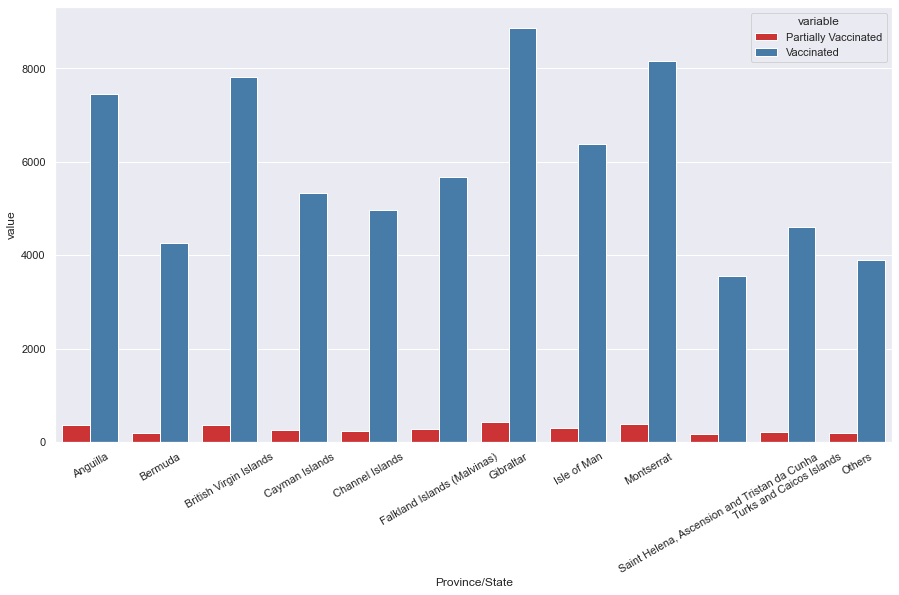

In [40]:
# Plot a vertical bar graph to display the percentage for the first dose to fully-dosed individuals.
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create a barplot.
vac = pd.read_csv('covid_19_uk_vaccinated.csv') 
vac['Partially Vaccinated'] = vac['First Dose'] - vac['Second Dose']
vac = pd.melt(vac, id_vars =['Province/State', 'Country/Region', 'Date'], value_vars =['Partially Vaccinated', 'Vaccinated'])
plt.figure(figsize = (15,8))

# Remove confidence interval (error lines) with "ci=None"
ax = sns.barplot(x='Province/State', y='value', hue='variable', data=vac, ci=None, palette='Set1')
ax.set_xticklabels(ax.get_xticklabels( ),rotation = 30)

#Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective1.png", dpi=300)

In [41]:
# Group the data by Province/State and Date, and aggregate the death count.
cov = pd.read_csv('covid_19_uk_cases.csv')
cov['Date'] = pd.to_datetime(cov['Date'])
cov_deaths = cov.groupby(["Province/State", "Date"])[["Deaths"]].sum().reset_index()
cov_deaths

,Province/State,Date,Deaths
0,Anguilla,2020-01-22,0.0
1,Anguilla,2020-01-23,0.0
2,Anguilla,2020-01-24,0.0
3,Anguilla,2020-01-25,0.0
4,Anguilla,2020-01-26,0.0
5,Anguilla,2020-01-27,0.0
6,Anguilla,2020-01-28,0.0
7,Anguilla,2020-01-29,0.0
8,Anguilla,2020-01-30,0.0
9,Anguilla,2020-01-31,0.0


<AxesSubplot:xlabel='Date', ylabel='Deaths'>

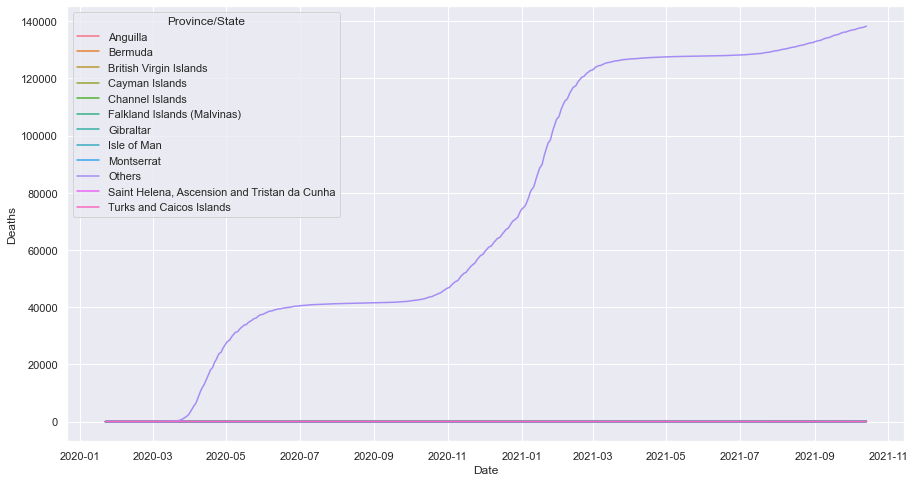

In [42]:
#figure.figsize':(15,8)}) code to increase the size of the plot
plt.figure(figsize = (15,8))

# Create a lineplot to display the trend of deaths across all regions over time. 
# (Hint: Use the sns.set(rc = {'figure.figsize':(15,8)}) code to increase the size of the plot.)
sns.lineplot(x='Date', y='Deaths', hue ='Province/State', data=cov_deaths, ci=None)

In [43]:
#Group the data by Province/State aggregating the death count to find which Province/State causes the data set to be skewed.
cov = pd.read_csv('covid_19_uk_cases.csv')
cov_skewed = cov.groupby("Province/State")[["Deaths"]].sum().reset_index()
cov_skewed

,Province/State,Deaths
0,Anguilla,24.0
1,Bermuda,10353.0
2,British Virgin Islands,3573.0
3,Cayman Islands,911.0
4,Channel Islands,37130.0
5,Falkland Islands (Malvinas),0.0
6,Gibraltar,25412.0
7,Isle of Man,15051.0
8,Montserrat,539.0
9,Others,46987145.0


<AxesSubplot:xlabel='Date', ylabel='Deaths'>

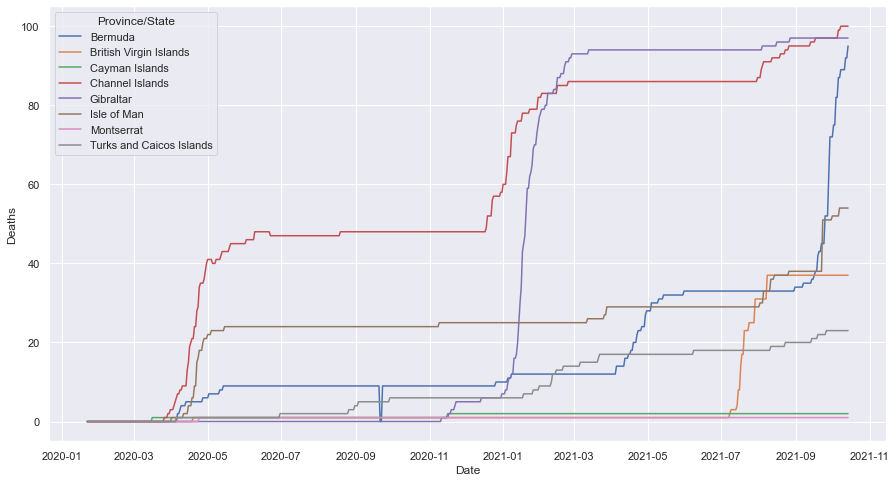

In [44]:
#figure.figsize':(15,8)}) code to increase the size of the plot
plt.figure(figsize = (15,8))

# Re-create the lineplot excluding the Province/State that is causing the skewed data set.
cov_final = cov_deaths[(cov_deaths['Province/State'] != 'Anguilla') 
                     & (cov_deaths['Province/State'] != 'Falkland Islands (Malvinas)')
                     & (cov_deaths['Province/State'] != 'Saint Helena, Ascension and Tristan da Cunha')
                     & (cov_deaths['Province/State'] != 'Others')]
sns.lineplot(x='Date', y='Deaths', hue ='Province/State', data=cov_final, ci=None)

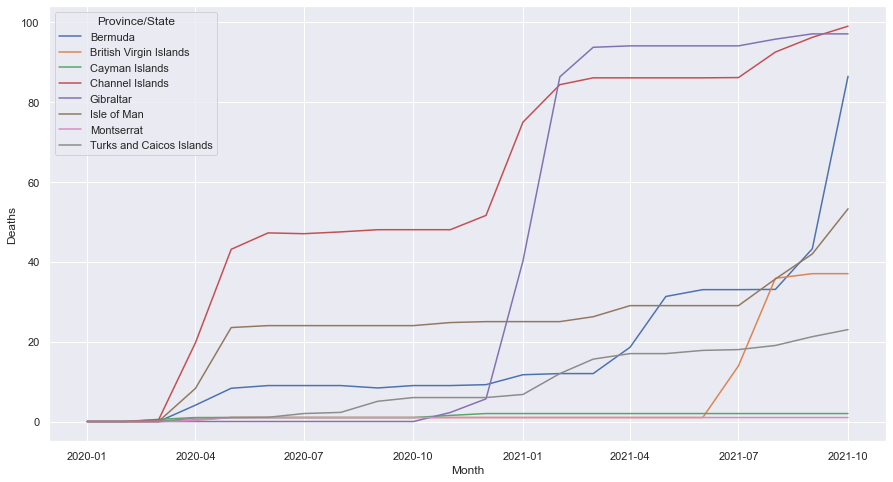

In [45]:
# Disable the warnings suggestion(default='warn')
import pandas as pd
pd.options.mode.chained_assignment = None  

# Convert Date into Months.
cov_final['Month'] = pd.to_datetime(cov_final['Date']+pd.offsets.MonthBegin(-1))

#figure.figsize':(15,8)}) code to increase the size of the plot and plot the same line graph as previously.
plt.figure(figsize = (15,8))
sns_lineplot = sns.lineplot(x='Month', y='Deaths', hue ='Province/State', data=cov_final, ci=None)
fig = sns_lineplot

#Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective2.png", dpi=300)

In [46]:
# Group the data by Province/State,aggregate the count of recovered cases,sort recovered cases in ascending order.
cov_recov = cov.groupby(["Province/State", "Date"])[["Recovered"]].sum().reset_index()
cov_recov['Date'] = pd.to_datetime(cov_recov['Date'])
cov_recov.sort_values(by=['Recovered'], inplace=True, ascending=True)
cov_recov

,Province/State,Date,Recovered
0,Anguilla,2020-01-22,0.0
4487,Isle of Man,2020-03-25,0.0
4488,Isle of Man,2020-03-26,0.0
4489,Isle of Man,2020-03-27,0.0
4490,Isle of Man,2020-03-28,0.0
4491,Isle of Man,2020-03-29,0.0
4492,Isle of Man,2020-03-30,0.0
4493,Isle of Man,2020-03-31,0.0
4494,Isle of Man,2020-04-01,0.0
4495,Isle of Man,2020-04-02,0.0


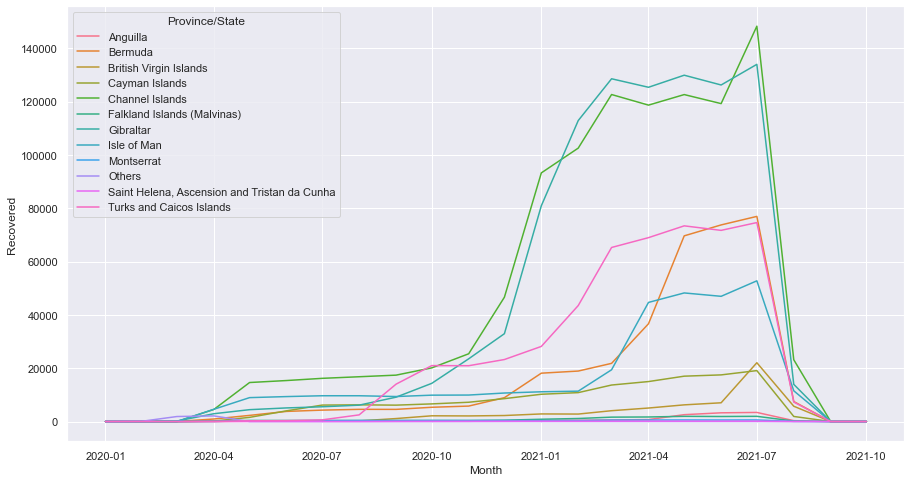

In [47]:
# Convert Date into Months as previously and create a lineplot.
cov_recov['Month'] = pd.to_datetime(cov_recov['Date']+pd.offsets.MonthBegin(-1))

# Group Province/State and Month to aggregate the count of recovered cases.
cov_recov1 = cov_recov.groupby(["Province/State", "Month"])[["Recovered"]].sum().reset_index()

# Create a lineplot to visualise the trend of recovered cases across the months.
plt.figure(figsize = (15,8))
sns_lineplot = sns.lineplot(x='Month', y='Recovered', hue ='Province/State', data=cov_recov1, ci=None)
fig = sns_lineplot

# Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective3.png", dpi=300)

In [48]:
# Group the data by Province/State,aggregate the count of hospitalised cases,sort hospitalised cases in ascending order.
cov_hosp = cov.groupby(["Province/State", "Date"])[["Hospitalised"]].sum().reset_index()
cov_hosp['Date'] = pd.to_datetime(cov_hosp['Date'])
cov_hosp.sort_values(by=['Hospitalised'], inplace=True, ascending=True)
cov_hosp

,Province/State,Date,Hospitalised
0,Anguilla,2020-01-22,0.0
3176,Falkland Islands (Malvinas),2020-02-07,0.0
3175,Falkland Islands (Malvinas),2020-02-06,0.0
3174,Falkland Islands (Malvinas),2020-02-05,0.0
3173,Falkland Islands (Malvinas),2020-02-04,0.0
3172,Falkland Islands (Malvinas),2020-02-03,0.0
3171,Falkland Islands (Malvinas),2020-02-02,0.0
3170,Falkland Islands (Malvinas),2020-02-01,0.0
3169,Falkland Islands (Malvinas),2020-01-31,0.0
3168,Falkland Islands (Malvinas),2020-01-30,0.0


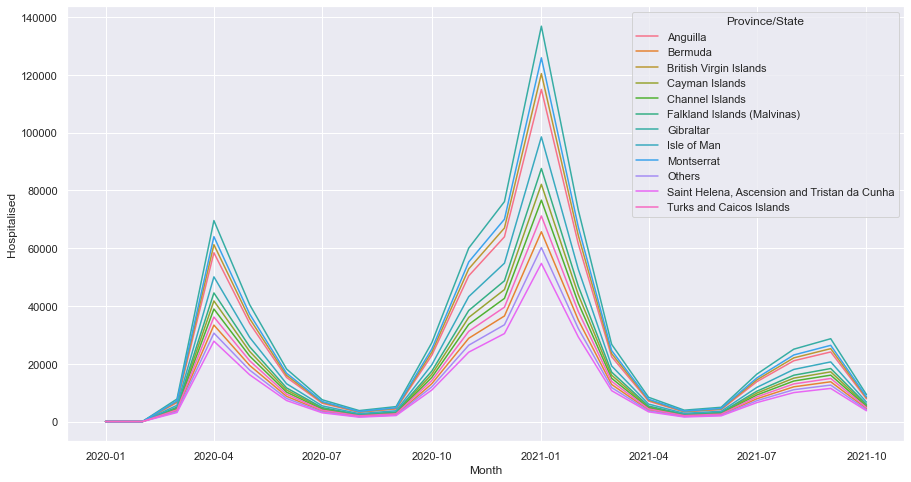

In [49]:
# Convert Date into Months as previously and create a lineplot.
cov_hosp['Month'] = pd.to_datetime(cov_hosp['Date']+pd.offsets.MonthBegin(-1))

# Group Province/State and Month to aggregate the count of hospitalised cases.
cov_hosp2 = cov_hosp.groupby(["Province/State", "Month"])[["Hospitalised"]].sum().reset_index()

# Create a lineplot to visualise the trend of hospitalised cases across the months.
plt.figure(figsize = (15,8))
sns_lineplot = sns.lineplot(x='Month', y='Hospitalised', hue ='Province/State', data=cov_hosp2, ci=None)
fig = sns_lineplot

# Save this visualisation in an exported and shareable format (PNG)
plt.savefig("Objective4.png", dpi=300)

In [50]:
# Group the data by Province/State,aggregate the count of cases,sort cases in ascending order.
cov_cases = cov.groupby(["Province/State", "Date"])[["Cases"]].sum().reset_index()
cov_cases['Date'] = pd.to_datetime(cov_cases['Date'])
cov_cases.sort_values(by=['Cases'], inplace=True, ascending=True)
cov_cases

,Province/State,Date,Cases
0,Anguilla,2020-01-22,0.0
1312,British Virgin Islands,2020-03-10,0.0
1311,British Virgin Islands,2020-03-09,0.0
1310,British Virgin Islands,2020-03-08,0.0
1309,British Virgin Islands,2020-03-07,0.0
1308,British Virgin Islands,2020-03-06,0.0
1307,British Virgin Islands,2020-03-05,0.0
1306,British Virgin Islands,2020-03-04,0.0
1313,British Virgin Islands,2020-03-11,0.0
1305,British Virgin Islands,2020-03-03,0.0


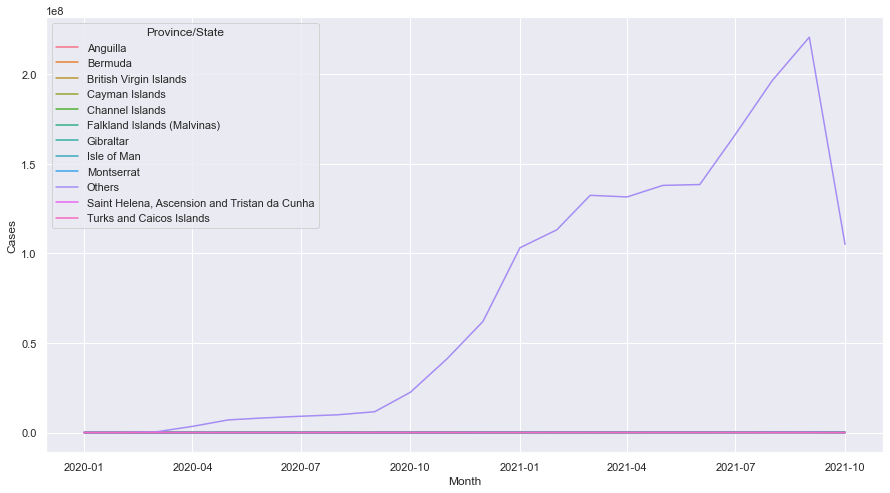

In [51]:
# Convert Date into Months as previously and create a lineplot.
cov_cases['Month'] = pd.to_datetime(cov_cases['Date']+pd.offsets.MonthBegin(-1))

# Group Province/State and Month to aggregate the count of cases.
cov_cases2 = cov_cases.groupby(["Province/State", "Month"])[["Cases"]].sum().reset_index()

# Create a lineplot to visualise the trend of cases across the months.
plt.figure(figsize = (15,8))
sns_lineplot = sns.lineplot(x='Month', y='Cases', hue ='Province/State', data=cov_cases2, ci=None)
fig = sns_lineplot

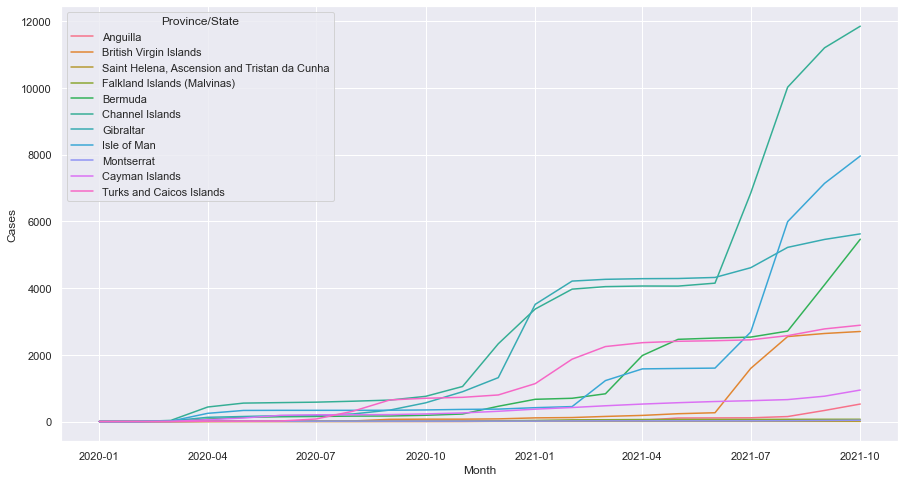

In [52]:
# Disable the warnings suggestion(default='warn')
import pandas as pd
pd.options.mode.chained_assignment = None  
 
# Re-create the lineplot excluding the Province/State that is causing the skewed data set.
cov_cases_final = cov_cases[(cov_cases['Province/State'] != 'Others')]
cov_cases_final['Month'] = pd.to_datetime(cov_cases_final['Date']+pd.offsets.MonthBegin(-1))
plt.figure(figsize = (15,8))
sns.lineplot(x='Month', y='Cases', hue ='Province/State', data=cov_cases_final, ci=None)

# Save this visualisation in an exported and shareable format (PNG)
fig = sns_lineplot
plt.savefig("Objective5.png", dpi=300)

In [54]:
# Aggregate the total of cases, deaths, recovered, hospitalised. Calculate the rate of highest recoveries by region.
highest_recov = cov.groupby("Province/State")[["Cases","Deaths", "Recovered", "Hospitalised"]].sum().reset_index()
highest_recov['highest_recov'] = highest_recov['Recovered']/highest_recov['Cases']
highest_recov.sort_values(by=['highest_recov'], inplace=True, ascending=False)
highest_recov

,Province/State,Cases,Deaths,Recovered,Hospitalised,highest_recov
10,"Saint Helena, Ascension and Tristan da Cunha",1.438000e+03,4.0,1135.0,259773.0,0.789291
5,Falkland Islands (Malvinas),2.048200e+04,0.0,14754.0,415650.0,0.720340
3,Cayman Islands,2.177560e+05,911.0,152052.0,389669.0,0.698268
11,Turks and Caicos Islands,7.526180e+05,5612.0,515923.0,337710.0,0.685504
6,Gibraltar,1.413853e+06,25412.0,956103.0,649459.0,0.676239
8,Montserrat,9.556000e+03,539.0,6376.0,597486.0,0.667225
1,Bermuda,6.854420e+05,10353.0,363999.0,311547.0,0.531043
4,Channel Islands,1.957978e+06,37130.0,1027626.0,363690.0,0.524840
7,Isle of Man,8.871330e+05,15051.0,328319.0,467605.0,0.370090
0,Anguilla,3.531500e+04,24.0,12708.0,545540.0,0.359847


### 4.Conclusion
* Region having the most recoveries are Channels Islands and Gibraltar. It has not been consistent overtime, on the contrary, it can be noticed a sharp increase starting from November 2020, having a steadiness from April 2021 until June 2021 and then followed by a sudden drop in August 2021. It is also important to note that there is a trend for all regions dropping in recoveries around August 2021 and reaching its lowest numbers by September 2021.
* It can be argued that for the initial marketing campaigns, based on the rate calculation of recoveries and cases, top 3 regions to be excluded are Saint Helena, Ascension and Tristan da Cunha, Falkland Islands, Cayman Islands. 
* When looking at the trend of the death cases below, it can be clearly seen a rise starting from March 2020. Channel Islands has a consistent increase throughout the period hitting its highest peak in October 2021.It’s important to notice that Gibraltar shows sharp high levels of deaths starting from December 2020 and continues so throughout. An unclear explanation to the data of Gibraltar is that it starts with higher cases of hospitalised than the registered cases and hence, it’s crucial to look at the source of data provided again and investigate the issue. Overall, the states and provinces have a trend of deaths increase starting from March, 2021 until October 2021, except for Montserrat and Cayman Islands with a steady low number of cases during all the period provided in the data. British Virgin Islands are also experiencing low numbers of cases up until a sudden peak in July 2021. There were also groups of regions that were skewing the data having no cases registered to extremely high numbers e.g “Others”. It was crucial in stripping them out and see a clear picture of deaths across the territories.
* When assessing the trend between hospitalisations and cases, an insight could be brought on the discrepancy of that. There is a peak in hospitalisation across regions in January and when comparing these with the cases during the same period, the numbers are substantially low, which is wrong. It can be argued that a peak should be reached for regions as Channel Islands, Isle of Man, Gibraltar and Bermuda according to the “Cases” visual below.

## 5) Assignment activity 5: External data 
In the next section, you were supplied with a sample file and the question was asked to determine whether there are additional `#tags` or keywords that could potentially provide insights into your COVID-19 analysis. While the sample set is limited, you were asked to review the provided file and demonstrate the typical steps and make recommendations regarding future use of similar data sets to provide richer insights.

In [55]:
# Import the necessary libraries and settings
import pandas as pd
import seaborn as sns
pd.options.display.max_colwidth = 200
sns.set(rc = {'figure.figsize':(15,10)})

In [56]:
# Import the tweet data set
tweets = pd.read_csv('tweets.csv')

In [57]:
# Explore the data: info(), head()
tweets.info()
tweets.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   created_at                 3959 non-null   object 
 1   id                         3959 non-null   float64
 2   id_str                     3959 non-null   float64
 3   text                       3959 non-null   object 
 4   truncated                  3959 non-null   object 
 5   source                     3959 non-null   object 
 6   in_reply_to_status_id      0 non-null      float64
 7   in_reply_to_status_id_str  0 non-null      float64
 8   in_reply_to_user_id        0 non-null      float64
 9   in_reply_to_user_id_str    0 non-null      float64
 10  in_reply_to_screen_name    0 non-null      float64
 11  contributors               0 non-null      float64
 12  is_quote_status            3959 non-null   object 
 13  retweet_count              3960 non-null   int64

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,"#COVID19 is linked to more #diabetes diagnoses in kids, CDC study finds https://t.co/H5lO1W7Skd via @YouTube",False,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps://t.co/aUQ93qFsJ4 | +443333053358\n#slough #sloughtownfc #sloughtown #sloughi #windsor #windsorcastle #diabetes #physician #generalphysician\n#hospita...,False,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN


In [58]:
# Explore the structure, count the tweets, get the elements of interest
tweets.retweet_count.value_counts()

0       2818
1        570
2        190
3         96
4         54
5         33
6         29
7         17
8         14
11        10
14        10
10         9
9          8
17         8
21         6
12         6
19         5
13         5
16         5
28         4
44         3
27         3
23         3
15         3
37         3
38         2
107        2
54         2
67         2
43         2
25         2
65         1
63         1
48         1
85         1
29         1
30         1
22         1
130        1
89         1
398        1
18         1
32         1
466        1
112        1
90         1
319        1
253        1
116        1
304        1
60         1
79         1
1565       1
369        1
56         1
42         1
118        1
199        1
195        1
963        1
24         1
31         1
49         1
33         1
261        1
212        1
52         1
Name: retweet_count, dtype: int64

In [59]:
tweets.favorite_count.value_counts()

0       2240
1        682
2        252
3        174
4        100
5         75
6         51
7         39
8         38
9         24
10        22
11        16
13        15
12        13
17        12
14        12
24        11
15        11
18         8
16         8
25         7
19         7
22         6
29         5
20         5
23         5
21         5
30         4
39         3
31         3
26         3
40         3
53         3
242        2
27         2
81         2
32         2
47         2
48         2
45         2
89         2
43         2
70         2
33         2
185        2
28         2
65         2
181        1
57         1
71         1
293        1
145        1
621        1
837        1
80         1
149        1
909        1
2251       1
44         1
4376       1
1003       1
66         1
140        1
264        1
72         1
3496       1
649        1
766        1
722        1
79         1
317        1
228        1
85         1
169        1
183        1
147        1
582        1

In [60]:
# Create a DataFrame with the text only
tweets['texts'] = tweets['text'].astype(str)
tweets_text = tweets['texts'].apply(lambda x: x if x.strip() != None else None)

In [61]:
# Loop through the messages and build a list of values containing the # symbol
tags = []
for y in [x.split (' ') for x in tweets_text.values]:
    for z in y:
        if '#' in z:
            tags.append(z)
            
#Create a series containing the value counts in the list
tags = pd.Series(tags).value_counts()

#Display the first 20 records
tags.head(20)

#COVID19                1632
#CovidIsNotOver          472
#China                   262
#covid19                 176
#Covid19                 148
#COVID                   108
#covid                   104
#Greece                  103
#coronavirus             100
#PeoplesVaccine.          84
#CoronaUpdate             84
#Omicron                  83
#COVID2020                82
#covid19uk                80
#CoronavirusOutbreak      80
#COVID19Pandemic          80
#monkeypox                77
#globalhealth             76
#publichealth             72
#healthtech               69
dtype: int64

In [62]:
#Convert the series into a DataFrame
covid_data = pd.DataFrame(tags).reset_index()

#Rename the columns in the DataFrame
covid_data.columns = ['Word', 'Count']

#Change the datatype of counts to integer
covid_data['Count'] = covid_data['Count'].astype(int)
covid_data

,Word,Count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103
8,#coronavirus,100
9,#PeoplesVaccine.,84


In [63]:
# Filter and sort
# Display records higher than 100 retweets.
display(covid_data.loc[(covid_data['Count']>100)])

,Word,Count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103


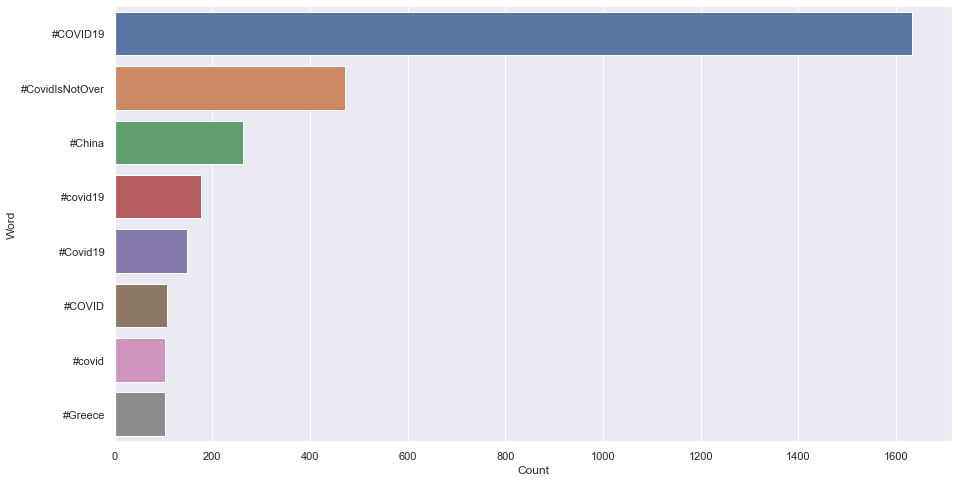

In [64]:
# Plot the recors higher than 100 retweets, using a seaborn barplot with the 'y' set to 'Word'
plt.figure(figsize = (15,8))
ax = sns.barplot(x="Count", y="Word", data = covid_data.loc[(covid_data['Count']>100)])

In [65]:
# Text Review - manual list of stopwords to be removed.

sw_list = ['a', 'about', 'actually', 'almost', 'also', 'although', 'always', 'am', 'an', 'and', 'any', 
           'are', 'as', 'at', 'be', 'became', 'become', 'but', 'by', 'can', 'could', 'did', 'do', 'does', 
           'each', 'either', 'else', 'for', 'from', 'had', 'has', 'have', 'hence', 'how', 'i', 'if', 'in',
           'is', 'it', 'its', 'just', 'may', 'maybe', 'me', 'might', 'mine', 'must', 'my', 'neither', 'nor',
           'not', 'of', 'oh', 'ok', 'when', 'whenever', 'where', 'whereas', 'wherever', 'whether', 'which', 
           'while', 'who', 'whoever', 'whome', 'whose', 'why', 'will', 'with', 'within', 'without', 'would',
           'yes', 'yet', 'you', 'your', 'to', 'the', 'of', 'and', 'are', 'was', 'this', 'on', 'now', 'over', 
           'us', 'so', 'more', 'our', 'they', 'we', 'after', 'or', 'no', 'still', 'day', 'out', 'our', 'one', 
           'all', '&amp;', "-", "|", "that", " "]

In [66]:
# Convert the text of the tweets to a list of tweets
tweets_text_values = tweets_text.values

#Convert each tweet to a list of words
tweets_text_values_words = [x.split(' ') for x in tweets_text_values]

#Create empty list
tweets_text_values_words_all = []

#Append to the list and removed http, mentions, and, selected keywords.
tweets_text_values_words_all = [z for y in tweets_text_values_words for z in y if 'http' not in z and not z.startswith(("@","#")) and z.lower() not in sw_list]

#Create a series with the value counts of the keywords identified.
tweets_text_values_words_all = pd.Series(tweets_text_values_words_all).value_counts()

#Display the first 50 entries of the Series
tweets_text_values_words_all.head(50)

               1738
Covid           348
people          303
Greece          275
COVID-19        267
cases           228
Athens,         211
Athens          209
new             205
COVID           198
been            185
Covid-19        153
being           152
vaccine         147
COVID19         143
up              142
China           141
covid           140
their           135
per             126
like            125
I’m             125
way             124
were            123
cause           118
get             118
New             111
safe            111
via             110
first           108
pandemic        106
Please          104
until           100
join            100
–                99
during           99
than             98
said             97
protection       96
reported         95
Coronavirus      94
sign             91
Deaths           90
safe.            90
Health           89
positive         88
stand            87
2022             86
denied           86
urgently         86


In [67]:
# Use the series to create a new DataFrame for a new visualisation.
covid_data2 = pd.DataFrame(tweets_text_values_words_all.head(20)).reset_index()

#Rename the columns 
covid_data2.columns = ['Word', 'Count']

In [68]:
# Display the result 
covid_data2 = covid_data2[covid_data2['Word'].str.strip('Word') != '']
covid_data2

,Word,Count
1,Covid,348
2,people,303
3,Greece,275
4,COVID-19,267
5,cases,228
6,"Athens,",211
7,Athens,209
8,new,205
9,COVID,198
10,been,185


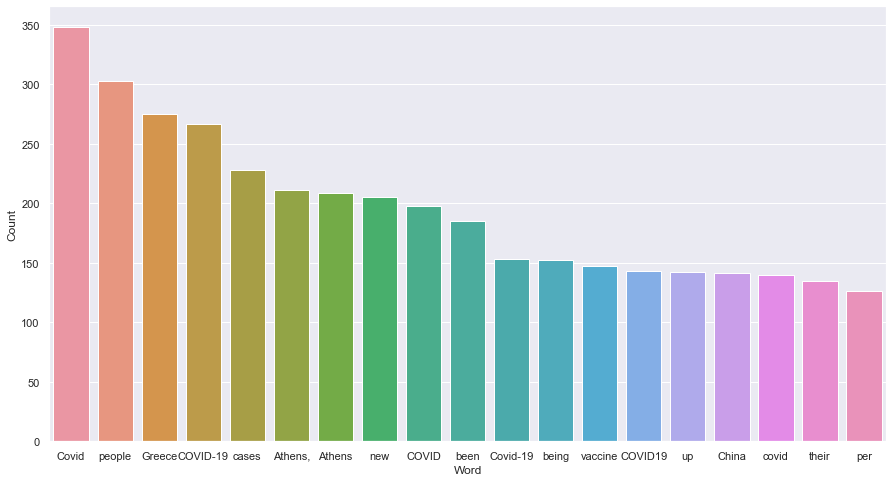

In [69]:
# Create a new barplot based on the results above.
plt.figure(figsize = (15,8))
ax = sns.barplot(x="Word", y="Count", data = covid_data2)

In [70]:
# Let's look at the content of the tweets having the selected keywords.
tweet_content = pd.DataFrame(tweets_text_values)
tweet_content.columns = ['Tweets']
tweet_content

,Tweets
0,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation..."
1,"#COVID19 is linked to more #diabetes diagnoses in kids, CDC study finds https://t.co/H5lO1W7Skd via @YouTube"
2,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation..."
3,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation..."
4,Advanced healthcare at your fingertips\nhttps://t.co/aUQ93qFsJ4 | +443333053358\n#slough #sloughtownfc #sloughtown #sloughi #windsor #windsorcastle #diabetes #physician #generalphysician\n#hospita...
5,Deciphering ADA 2021: Minimize Risks for People with Diabetes in COVID-19 by Dr. G Shanmugan Sundar\n#trd #ADA2021 #covid19 #diabetes \nWatch full video here: https://t.co/sr3uKjK9zo https://t.c...
6,"It can’t really be called a pandemic when less than half of one percent of people who catch the virus die from it, and 99 percent of those people are already dying from cancer, heart disease, diab..."
7,Out of the hospital from DKA.. now I tested positive for Covid… why me #T1D #Diabetes #COVID19
8,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation..."
9,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation..."


In [71]:
# Create a subset of the DataFrame containg the tweets with selected keywords only.
subset = tweet_content[tweet_content['Tweets'].str.contains('vaccinated')]

#Loop through the DataFrame and print each element.
for i in subset.index:
    print("Tweet: ", i)
    print(subset.loc[i,"Tweets"], '\n')

Tweet:  110
Analysis of 1.6 million records confirm risks of #LongCovid &amp; incident #hypertension, #diabetes, &amp; #heartdisease substantially lower among vaccinated patients with breakthrough infection vs. those with #COVID19 who were unvaccinated #vaccine 💉💉🙏
https://t.co/VXKlGUYFyW 

Tweet:  207
Does anyone know if there are stats on how many of the monkeypox cases are in ppl who are #vaccinated against #COVID19? It is possible that it is a side effect of the #CovidVaccine no? Shingles is a possible side effect of the vax, and it looks just like shingles. No? 

Tweet:  301
JUST IN: @CTGOP gubernatorial candidate Bob Stefanowski tests positive for #COVID19; says "I am vaccinated, boosted, and feeling fine so far. I will continue to follow all CDC protocols." #ctpolitics 

Tweet:  332
Today I tested positive for #MonkeyPox. I am fortunate that my symptoms are completely non-existent, as I have gotten all of the #COVID19 vaccines and 8 boosters. I urge everyone to do their part and

### 5.Conclusion:
* Having looked at the tweets data set, it could be investigated into additional hashtags related to Covid-19 as well as stripping out a list of stop words that would help us filter through the important content of the tweets text and bring the most used words. As a result, the top hashtags and keywords were based on Covid discussion and majority of the content was about encouraging the vaccination and side effects this virus can bring if not taking the jab.

## 6) Assignment activity 6: 
- Demonstrate using external function and interpret results.
- Note observations.

In [86]:
# Libraries and settings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [73]:
# Simple hacks to make plots look better: 

# # Colour pallete to make charts look better.
blue, = sns.color_palette("muted", 1) 

# Darkgrid, white grid, dark, white and ticks.
sns.set_style('whitegrid') 

# Font size of the axes title.
plt.rc('axes', titlesize=18) 

# Font size of the x and y labels.
plt.rc('axes', labelsize=14)    

# Font size of the tick labels.
plt.rc('xtick', labelsize=13,color='#4f4e4e') 

# Font size of the tick labels.
plt.rc('ytick', labelsize=13,color='#4f4e4e')  

# Legend font size.
plt.rc('legend', fontsize=13)

# Controls default text sizes.
plt.rc('font', size=13)  

In [74]:
# Load and select relevant subset of the data
# Make sure to change the relative path to function in your environment
cov_hosp = pd.read_csv('covid_19_uk_cases.csv')
cov_hosp = cov[['Province/State','Date','Hospitalised']]

In [75]:
# Select data for the requested province, Channel Islands.
# The Channel Islands are relatively 'remote' and a perfect choice to see how the population responded to the vaccination.
cov_hosp_ci = cov_hosp[cov_hosp['Province/State'] == "Channel Islands"]

In [88]:
# Define function to plot moving averages
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):
    
    # Create a rolling window to calculate the rolling mean using the series.rolling function
    rolling_mean = series.rolling(window=window).mean()
    
    # Declare the dimensions for the plot, plot name and plot the data consisting of the rolling mean from above 
    plt.figure(figsize=(18,4))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Simple moving average trend')

    
    # Plot confidence intervals for smoothed values
    if plot_intervals:
        
        # Calculate the mean absolute square 
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        
        # Calculate the standard deviation using numpy's std function
        deviation = np.std(series[window:] - rolling_mean[window:])
        
        # Calculate the upper and lower bounds 
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        
        # Name and style upper and lower bound lines and labels 
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
    
    # Plot the actual values for the entire timeframe
    plt.plot(series[window:], label='Actual values')
    plt.grid(True)

In [89]:
# Use the same function setting the window to seven days.
cov_hosp_ci['SMA_7'] = cov_hosp_ci.Hospitalised.rolling(window=7).mean()
cov_hosp_ci

,Province/State,Date,Hospitalised,SMA_7
Date,,,,
2020-01-22,Channel Islands,2020-01-22,0.0,NaN
2020-01-23,Channel Islands,2020-01-23,0.0,NaN
2020-01-24,Channel Islands,2020-01-24,0.0,NaN
2020-01-25,Channel Islands,2020-01-25,0.0,NaN
2020-01-26,Channel Islands,2020-01-26,0.0,NaN
2020-01-27,Channel Islands,2020-01-27,0.0,NaN
2020-01-28,Channel Islands,2020-01-28,0.0,0.000000
2020-01-29,Channel Islands,2020-01-29,0.0,0.000000
2020-01-30,Channel Islands,2020-01-30,0.0,0.000000


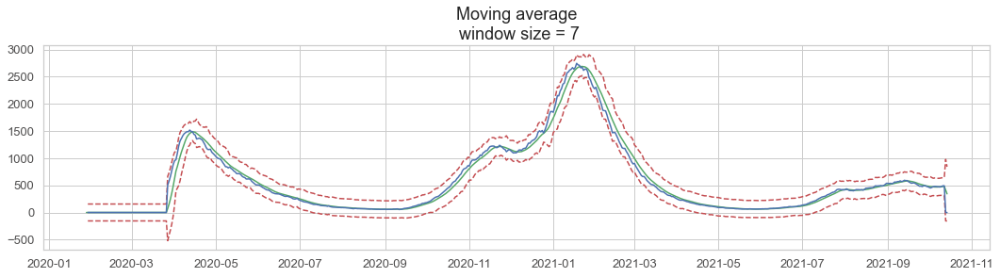

In [92]:
# Define function to calculate the mean absolute error
def mean_absolute_error(a, b): return abs(b - a)
#Visualise the plot
import datetime as dt
cov_hosp_ci.index = pd.DatetimeIndex(cov_hosp_ci['Date'])
plot_moving_average(cov_hosp_ci.Hospitalised, 7, plot_intervals=True)

In [93]:
# Return the top three days with biggest difference between daily value and rolling 7-day mean
cov_hosp_ci2 = cov_hosp_ci.copy()
cov_hosp_ci2_rolling = cov_hosp_ci2['Hospitalised'].rolling(window=7).mean()
cov_hosp_ci2['error'] = mean_absolute_error(cov_hosp_ci2['Hospitalised'][7:], cov_hosp_ci2_rolling[7:])
cov_hosp_ci2.sort_values('error', ascending=False).head(3)

,Province/State,Date,Hospitalised,SMA_7,error
Date,,,,,
2020-03-27,Channel Islands,2020-03-27,509.0,72.714286,436.285714
2020-03-28,Channel Islands,2020-03-28,579.0,155.428571,423.571429
2020-03-29,Channel Islands,2020-03-29,667.0,250.714286,416.285714


### 6. Conclusion:
By completing the unfinished work of the external consultant who resigned, a reason on the functions proposed by him was to:
* Show trends by using rolling average for a time series in order to smoothen the short-term variations.
* Returning the top three days with the biggest difference between daily and rolling seven days mean for the purpose of detecting any errors in values that would affect the trend cycle



- **Question 1**: We have heard of both qualitative and quantitative data from the previous consultant. What are the differences between the two? Should we use only one or both of these types of data and why? How can these be used in business predictions? Could you provide examples of each?

Due to insufficient historic data in that scenario both qualitative and quantitative forecasting methods are important. Focusing on quantitative only would have been enough if we had accurate historic data of population, cases, and hospitalisation. However, with the help of the qualitative, more relevant predictions can be made with the assistance of experts and patients in the case of Covid-19 scenario. Delphi method, Market research or Panel consensus methods would help and compile opinions to make accurate forecasting on marketing campaigns across regions.

- **Question 2**: We have also heard a bit about the need for continuous improvement. Why should this be implemented, it seems like a waste of time. Why can’t we just implement the current project as it stands and move on to other pressing matters?

An important strategy that will bring long term success is to always seek “Continuous Improvement.” This will not only affect positively the current Covid-19 project but will impact the quality of future processes. Prioritising, sharing issues/ideas, review progress and execute the change across different departments is key. 

- **Question 3**: As a government, we adhere to all data protection requirements and have good governance in place. We only work with aggregated data and therefore will not expose any personal details. Have we covered everything from a data ethics standpoint? Is there anything else we need to implement from a data ethics perspective? 

Another factor to consider especially when dealing with qualitative data is to have a data ethics framework. Even though the government adheres to the data protection rules, is there a formalised documentation on that? Having a strong code of ethics in place will only bring in transparency and positive social influence.


